# Module 3: Customer Segmentation

# NovaMart AI Retail Intelligence Platform

## Overview

Customer segmentation is the process of grouping customers with similar purchasing behaviours into distinct clusters. Unlike supervised learning, customer segmentation is an **unsupervised machine learning** task because the groups are not known beforehand.

For an e-commerce platform such as NovaMart, customer segmentation enables personalized marketing, targeted promotions, customer retention strategies, and recommendation systems.

This notebook develops a customer segmentation model using **K-Means clustering** to identify groups of customers with similar purchasing characteristics.

The segmentation model will provide valuable insights into customer behaviour and support data-driven business decision-making.

## Objectives

The objectives of this notebook are to:

- Construct customer-level behavioural features.
- Perform feature engineering for customer analytics.
- Prepare the data for clustering.
- Standardize numerical variables.
- Determine the optimal number of customer clusters.
- Segment customers using K-Means clustering.
- Profile each customer segment.
- Generate business recommendations for each customer group.

## Machine Learning Workflow

The customer segmentation process consists of the following stages:

1. Load the feature-engineered retail dataset.
2. Aggregate transactions at the customer level.
3. Engineer behavioural customer features.
4. Prepare and standardize the data.
5. Determine the optimal number of clusters.
6. Train the K-Means clustering model.
7. Visualize customer segments.
8. Interpret the clusters.
9. Generate actionable business insights.

In [2]:
# ==========================================================
# Import Libraries
# ==========================================================

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

from sklearn.decomposition import PCA

In [3]:
# ==========================================================
# Plot Settings
# ==========================================================

sns.set_style("whitegrid")

plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["font.size"] = 12

## Load Feature-Engineered Dataset

The customer segmentation model uses the feature-engineered retail dataset created in the previous module.

In [12]:
retail = pd.read_csv(
    "Retail_Featured_Dataset.csv",
    parse_dates=[
        "order_purchase_timestamp",
        "order_approved_at",
        "order_delivered_carrier_date",
        "order_delivered_customer_date",
        "order_estimated_delivery_date"
    ]
)

print(retail.shape)

(113049, 50)


In [6]:
retail.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,customer_geo_city,customer_geo_state,seller_lat,seller_lng,seller_geo_city,seller_geo_state,processing_days,shipping_days,delivery_delay_days,late_delivery
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,campos dos goytacazes,RJ,-22.497188,-44.127324,volta redonda,RJ,6.0,1.0,-9.0,0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,...,santa fe do sul,SP,-23.565754,-46.519097,sao paulo,SP,8.0,8.0,-3.0,0
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,...,para de minas,MG,-22.262802,-46.170735,borda da mata,MG,1.0,6.0,-14.0,0
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,...,atibaia,SP,-20.553651,-47.387145,franca,SP,2.0,4.0,-6.0,0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,...,varzea paulista,SP,-22.929583,-53.135750,loanda,PR,11.0,13.0,-16.0,0


## Customer Feature Engineering

The original dataset contains one row per purchased product.

For customer segmentation, the data must first be aggregated so that each row represents a single customer.

The following behavioural features are created for every customer:

- Number of Orders
- Total Spending
- Average Order Value
- Average Review Score
- Average Freight Cost
- Average Delivery Time
- Average Delivery Delay
- Average Processing Time
- Average Shipping Time
- Average Payment Installments
- Number of Product Categories Purchased

In [13]:
customer_df = (
    retail
    .groupby("customer_id")
    .agg(
        Number_of_Orders=("order_id","nunique"),

        Total_Spending=("payment_value","sum"),

        Average_Order_Value=("payment_value","mean"),

        Average_Review_Score=("review_score","mean"),

        Average_Freight=("freight_value","mean"),

        Average_Delivery_Time=("delivery_days","mean"),

        Average_Delivery_Delay=("delivery_delay_days","mean"),

        Average_Processing_Time=("processing_days","mean"),

        Average_Shipping_Time=("shipping_days","mean"),

        Average_Installments=("payment_installments","mean"),

        Product_Categories=("product_category_name_english","nunique")
    )
    .reset_index()
)

In [14]:
customer_df.shape

(98666, 12)

In [21]:
customer_df.head()

,customer_id,Number_of_Orders,Total_Spending,Average_Order_Value,Average_Review_Score,Average_Freight,Average_Delivery_Time,Average_Delivery_Delay,Average_Processing_Time,Average_Shipping_Time,Average_Installments,Product_Categories
0,00012a2ce6f8dcda20d059ce98491703,1,114.74,114.74,1.0,24.94,13.0,-6.0,2.0,11.0,8.0,1
1,000161a058600d5901f007fab4c27140,1,67.41,67.41,4.0,12.51,9.0,-10.0,3.0,5.0,5.0,1
2,0001fd6190edaaf884bcaf3d49edf079,1,195.42,195.42,5.0,15.43,5.0,-16.0,1.0,4.0,10.0,1
3,0002414f95344307404f0ace7a26f1d5,1,179.35,179.35,5.0,29.45,28.0,-1.0,2.0,25.0,1.0,1
4,000379cdec625522490c315e70c7a9fb,1,107.01,107.01,4.0,14.01,11.0,-5.0,0.0,9.0,1.0,1


In [22]:
#Missing Values
customer_df.isnull().sum()

customer_id                   0
Number_of_Orders              0
Total_Spending                0
Average_Order_Value           1
Average_Review_Score        749
Average_Freight               0
Average_Delivery_Time      2190
Average_Delivery_Delay     2190
Average_Processing_Time    1023
Average_Shipping_Time      2191
Average_Installments          1
Product_Categories            0
dtype: int64

### Instead of using only these 11 features, we can make the customer segmentation much stronger by adding Recency–Frequency–Monetary (RFM) features:

- Recency: Days since the customer's most recent purchase.
- Frequency: Number of unique orders.
- Monetary: Total spending.

RFM is an industry-standard framework for customer segmentation and will produce more meaningful clusters such as loyal customers, high-value customers, occasional buyers, and at-risk customers. We can incorporate these into the feature set before running K-Means in Part 2.

### Updated Customer Segmentation Strategy

We'll build customer features in two groups.

### Group 1: RFM Features (Core)
- Recency – Days since the customer's last purchase.
- Frequency – Number of unique orders.
- Monetary – Total amount spent.
### Group 2: Behavioural Features
- Average Review Score
- Average Delivery Time
- Average Delivery Delay
- Average Freight Cost
- Average Installments
- Number of Product Categories Purchased

This gives a compact but informative feature set.

## Construct RFM Features

RFM analysis summarizes customer purchasing behaviour using three variables:

- **Recency (R):** Number of days since the customer's most recent purchase.
- **Frequency (F):** Number of completed orders placed by the customer.
- **Monetary (M):** Total spending by the customer.

A reference date is required to calculate recency. The reference date is defined as one day after the latest purchase in the dataset.

In [36]:
# Reference date
snapshot_date = retail["order_purchase_timestamp"].max() + pd.Timedelta(days=1)

rfm = (
    retail.groupby("customer_unique_id")
    .agg(
        Recency=(
            "order_purchase_timestamp",
            lambda x: (snapshot_date - x.max()).days
        ),
        Frequency=("order_id", "nunique"),
        Monetary=("payment_value", "sum")
    )
    .reset_index()
)

rfm.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,27.19
2,0000f46a3911fa3c0805444483337064,542,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,293,1,196.89


### Step 2: Build the RFM Table

In [ ]:
rfm.head()

### Step 3: Behavioural Features

In [37]:
# ==========================================================
# Customer Behaviour Features
# ==========================================================

behaviour = (
    retail.groupby("customer_unique_id")
    .agg(
        Average_Review_Score=("review_score", "mean"),

        Average_Delivery_Time=("delivery_days", "mean"),

        Average_Delivery_Delay=("delivery_delay_days", "mean"),

        Average_Processing_Time=("processing_days", "mean"),

        Average_Shipping_Time=("shipping_days", "mean"),

        Average_Freight=("freight_value", "mean"),

        Average_Installments=("payment_installments", "mean"),

        Product_Categories=("product_category_name_english", "nunique"),

        Preferred_Payment_Method=(
            "payment_type",
            lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan
        ),

        Average_Order_Value=("payment_value", "mean")
    )
    .reset_index()
)

behaviour.head()

,customer_unique_id,Average_Review_Score,Average_Delivery_Time,Average_Delivery_Delay,Average_Processing_Time,Average_Shipping_Time,Average_Freight,Average_Installments,Product_Categories,Preferred_Payment_Method,Average_Order_Value
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,6.0,-5.0,1.0,4.0,12.00,8.0,1,credit_card,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,3.0,-5.0,1.0,1.0,8.29,1.0,1,credit_card,27.19
2,0000f46a3911fa3c0805444483337064,3.0,25.0,-2.0,2.0,23.0,17.22,8.0,1,credit_card,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,20.0,-12.0,0.0,19.0,17.63,4.0,1,credit_card,43.62
4,0004aac84e0df4da2b147fca70cf8255,5.0,13.0,-8.0,1.0,11.0,16.89,6.0,1,credit_card,196.89


### Step 4: Merge RFM with Behavioural Features

In [38]:
customer_df = (
    rfm.merge(
        behaviour,
        on="customer_unique_id",
        how="left"
    )
)

customer_df.head()

,customer_unique_id,Recency,Frequency,Monetary,Average_Review_Score,Average_Delivery_Time,Average_Delivery_Delay,Average_Processing_Time,Average_Shipping_Time,Average_Freight,Average_Installments,Product_Categories,Preferred_Payment_Method,Average_Order_Value
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,141.90,5.0,6.0,-5.0,1.0,4.0,12.00,8.0,1,credit_card,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,27.19,4.0,3.0,-5.0,1.0,1.0,8.29,1.0,1,credit_card,27.19
2,0000f46a3911fa3c0805444483337064,542,1,86.22,3.0,25.0,-2.0,2.0,23.0,17.22,8.0,1,credit_card,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,43.62,4.0,20.0,-12.0,0.0,19.0,17.63,4.0,1,credit_card,43.62
4,0004aac84e0df4da2b147fca70cf8255,293,1,196.89,5.0,13.0,-8.0,1.0,11.0,16.89,6.0,1,credit_card,196.89


### Step 5: Check Missing Values

In [39]:
customer_df.isnull().sum()

customer_unique_id             0
Recency                        0
Frequency                      0
Monetary                       0
Average_Review_Score         699
Average_Delivery_Time       2064
Average_Delivery_Delay      2064
Average_Processing_Time      968
Average_Shipping_Time       2065
Average_Freight                0
Average_Installments           1
Product_Categories             0
Preferred_Payment_Method       1
Average_Order_Value            1
dtype: int64

### Step 6: Handle Missing Values

In [40]:
# Fill numerical columns with their median values
numeric_cols = customer_df.select_dtypes(include=np.number).columns

customer_df[numeric_cols] = customer_df[numeric_cols].fillna(
    customer_df[numeric_cols].median()
)

# Fill the categorical payment method with the most common value
customer_df["Preferred_Payment_Method"] = (
    customer_df["Preferred_Payment_Method"]
    .fillna(customer_df["Preferred_Payment_Method"].mode()[0])
)

customer_df.isnull().sum()

customer_unique_id          0
Recency                     0
Frequency                   0
Monetary                    0
Average_Review_Score        0
Average_Delivery_Time       0
Average_Delivery_Delay      0
Average_Processing_Time     0
Average_Shipping_Time       0
Average_Freight             0
Average_Installments        0
Product_Categories          0
Preferred_Payment_Method    0
Average_Order_Value         0
dtype: int64

### Step 7: Summary Statistics

In [41]:
customer_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Recency,95420.0,243.600377,153.160320,1.00,119.0000,224.00,353.000,729.00
Frequency,95420.0,1.034018,0.211234,1.00,1.0000,1.00,1.000,16.00
Monetary,95420.0,213.514836,643.258367,0.00,63.9675,113.25,202.985,109312.64
Average_Review_Score,95420.0,4.108771,1.324102,1.00,4.0000,5.00,5.000,5.00
Average_Delivery_Time,95420.0,12.056694,9.454145,0.00,6.0000,10.00,15.000,209.00
Average_Delivery_Delay,95420.0,-11.853958,10.032920,-147.00,-17.0000,-12.00,-7.000,188.00
Average_Processing_Time,95420.0,2.284340,3.527343,-172.00,0.0000,1.00,3.000,125.00
Average_Shipping_Time,95420.0,8.848903,8.661683,-17.00,4.0000,7.00,11.000,205.00
Average_Freight,95420.0,20.226922,15.821985,0.00,13.3700,16.40,21.220,409.68
Average_Installments,95420.0,2.919648,2.694211,0.00,1.0000,2.00,4.000,24.00


### Step 8: RFM Distributions
Recency

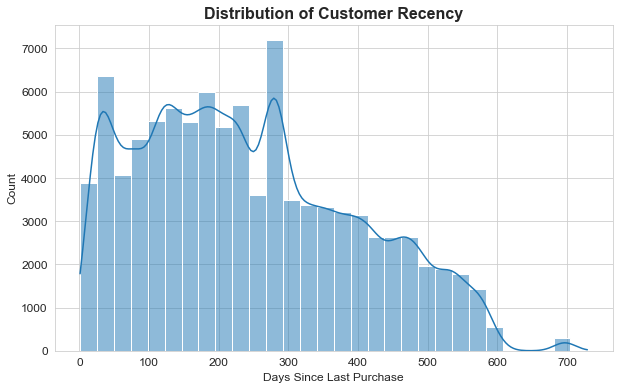

In [42]:
plt.figure(figsize=(10,6))

sns.histplot(
    customer_df["Recency"],
    bins=30,
    kde=True
)

plt.title(
    "Distribution of Customer Recency",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Days Since Last Purchase")

plt.show()

### Frequency

In [43]:
 customer_df["Frequency"].unique()

array([ 1,  2,  3,  4,  6,  7,  5,  9, 16], dtype=int64)

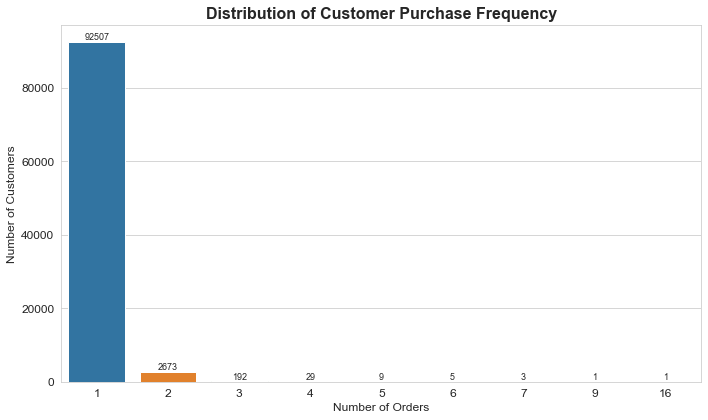

In [44]:
frequency_counts = (
    customer_df["Frequency"]
    .value_counts()
    .sort_index()
)

plt.figure(figsize=(10,6))

ax = sns.barplot(
    x=frequency_counts.index.astype(str),
    y=frequency_counts.values
)

for container in ax.containers:
    ax.bar_label(container, fontsize=9)

plt.title(
    "Distribution of Customer Purchase Frequency",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Orders")
plt.ylabel("Number of Customers")

plt.tight_layout()
plt.show()

### Percentage of Repeat Customers (Best Business Insight)

In [45]:
repeat_customers = (
    customer_df["Frequency"] > 1
).sum()

single_customers = (
    customer_df["Frequency"] == 1
).sum()

print(f"Single-purchase customers : {single_customers:,}")
print(f"Repeat customers          : {repeat_customers:,}")

print(
    f"Repeat purchase rate: "
    f"{repeat_customers / len(customer_df) * 100:.2f}%"
)

Single-purchase customers : 92,507
Repeat customers          : 2,913
Repeat purchase rate: 3.05%


## Interpretation
The purchase frequency distribution is highly skewed toward single-order customers, indicating that most customers made only one purchase during the observation period. A relatively small proportion of customers placed multiple orders, suggesting opportunities to improve customer retention and encourage repeat purchases through loyalty programs, personalized recommendations, and targeted marketing campaigns.

### Monetary

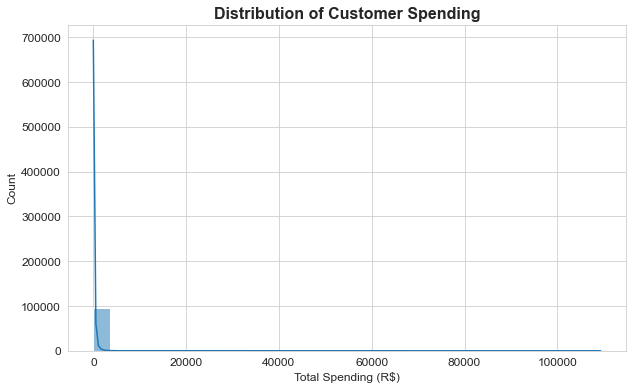

In [46]:
plt.figure(figsize=(10,6))

sns.histplot(
    customer_df["Monetary"],
    bins=30,
    kde=True
)

plt.title(
    "Distribution of Customer Spending",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Total Spending (R$)")

plt.show()

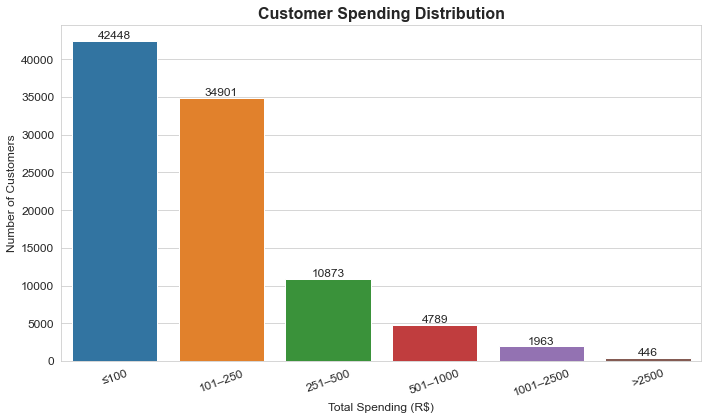

In [47]:
# Create spending ranges
customer_df["Spending_Range"] = pd.cut(
    customer_df["Monetary"],
    bins=[0, 100, 250, 500, 1000, 2500, customer_df["Monetary"].max()],
    labels=[
        "≤100",
        "101–250",
        "251–500",
        "501–1000",
        "1001–2500",
        ">2500"
    ],
    include_lowest=True
)

# Count customers in each range
spending_counts = (
    customer_df["Spending_Range"]
    .value_counts()
    .sort_index()
)

# Plot
plt.figure(figsize=(10,6))

ax = sns.barplot(
    x=spending_counts.index.astype(str),
    y=spending_counts.values
)

for container in ax.containers:
    ax.bar_label(container)

plt.title(
    "Customer Spending Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Total Spending (R$)")
plt.ylabel("Number of Customers")

plt.xticks(rotation=20)

plt.tight_layout()
plt.show()

# Determine the Optimal Number of Customer Clusters

Selecting the appropriate number of clusters (**K**) is a critical step in K-Means clustering.

Two evaluation techniques are employed:

- **Elbow Method**, which measures the Within-Cluster Sum of Squares (WCSS).
- **Silhouette Analysis**, which evaluates the quality of the resulting clusters.

The optimal number of clusters balances compactness within clusters and clear separation between clusters.

### Step 1: Create the feature matrix

In [48]:
# Remove visualization column if it exists
customer_df = customer_df.drop(
    columns=["Spending_Range"],
    errors="ignore"
)

# Create feature matrix
X = customer_df.drop(columns=["customer_unique_id"])

# One-hot encode payment method
X = pd.get_dummies(
    X,
    columns=["Preferred_Payment_Method"],
    drop_first=True
)

In [49]:
X.head()

,Recency,Frequency,Monetary,Average_Review_Score,Average_Delivery_Time,Average_Delivery_Delay,Average_Processing_Time,Average_Shipping_Time,Average_Freight,Average_Installments,Product_Categories,Average_Order_Value,Preferred_Payment_Method_credit_card,Preferred_Payment_Method_debit_card,Preferred_Payment_Method_voucher
0,116,1,141.90,5.0,6.0,-5.0,1.0,4.0,12.00,8.0,1,141.90,1,0,0
1,119,1,27.19,4.0,3.0,-5.0,1.0,1.0,8.29,1.0,1,27.19,1,0,0
2,542,1,86.22,3.0,25.0,-2.0,2.0,23.0,17.22,8.0,1,86.22,1,0,0
3,326,1,43.62,4.0,20.0,-12.0,0.0,19.0,17.63,4.0,1,43.62,1,0,0
4,293,1,196.89,5.0,13.0,-8.0,1.0,11.0,16.89,6.0,1,196.89,1,0,0


In [50]:
X.columns

Index(['Recency', 'Frequency', 'Monetary', 'Average_Review_Score',
       'Average_Delivery_Time', 'Average_Delivery_Delay',
       'Average_Processing_Time', 'Average_Shipping_Time', 'Average_Freight',
       'Average_Installments', 'Product_Categories', 'Average_Order_Value',
       'Preferred_Payment_Method_credit_card',
       'Preferred_Payment_Method_debit_card',
       'Preferred_Payment_Method_voucher'],
      dtype='object')

### Step 2: One-hot encode the payment method

### Step 3: Standardize the features

In [51]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

# Convert back to DataFrame
X_scaled = pd.DataFrame(
    X_scaled,
    columns=X.columns
)

X_scaled.head()

,Recency,Frequency,Monetary,Average_Review_Score,Average_Delivery_Time,Average_Delivery_Delay,Average_Processing_Time,Average_Shipping_Time,Average_Freight,Average_Installments,Product_Categories,Average_Order_Value,Preferred_Payment_Method_credit_card,Preferred_Payment_Method_debit_card,Preferred_Payment_Method_voucher
0,-0.833121,-0.161045,-0.111332,0.673085,-0.640642,0.683150,-0.364112,-0.559814,-0.519970,1.885664,-0.052404,-0.087243,0.552668,-0.124827,-0.137359
1,-0.813533,-0.161045,-0.289659,-0.082148,-0.957965,0.683150,-0.364112,-0.906168,-0.754456,-0.712512,-0.052404,-0.605436,0.552668,-0.124827,-0.137359
2,1.948293,-0.161045,-0.197892,-0.837381,1.369069,0.982168,-0.080611,1.633767,-0.190048,1.885664,-0.052404,-0.338773,0.552668,-0.124827,-0.137359
3,0.537999,-0.161045,-0.264117,-0.082148,0.840197,-0.014556,-0.647613,1.171960,-0.164135,0.400992,-0.052404,-0.531215,0.552668,-0.124827,-0.137359
4,0.322537,-0.161045,-0.025845,0.673085,0.099777,0.384133,-0.364112,0.248348,-0.210905,1.143328,-0.052404,0.161170,0.552668,-0.124827,-0.137359


In [52]:
print(X.dtypes)

Recency                                   int64
Frequency                                 int64
Monetary                                float64
Average_Review_Score                    float64
Average_Delivery_Time                   float64
Average_Delivery_Delay                  float64
Average_Processing_Time                 float64
Average_Shipping_Time                   float64
Average_Freight                         float64
Average_Installments                    float64
Product_Categories                        int64
Average_Order_Value                     float64
Preferred_Payment_Method_credit_card      uint8
Preferred_Payment_Method_debit_card       uint8
Preferred_Payment_Method_voucher          uint8
dtype: object


In [53]:
customer_df[
    ["Monetary", "Average_Order_Value"]
].corr()

,Monetary,Average_Order_Value
Monetary,1.000000,0.640988
Average_Order_Value,0.640988,1.000000


In [54]:
X_scaled = X_scaled.drop(columns=["Average_Order_Value"])
X_scaled.columns

Index(['Recency', 'Frequency', 'Monetary', 'Average_Review_Score',
       'Average_Delivery_Time', 'Average_Delivery_Delay',
       'Average_Processing_Time', 'Average_Shipping_Time', 'Average_Freight',
       'Average_Installments', 'Product_Categories',
       'Preferred_Payment_Method_credit_card',
       'Preferred_Payment_Method_debit_card',
       'Preferred_Payment_Method_voucher'],
      dtype='object')

In [55]:
# ==========================================================
# Elbow Method
# ==========================================================

wcss = []

K = range(2,11)

for k in K:

    model = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=10
    )

    model.fit(X_scaled)

    wcss.append(model.inertia_)

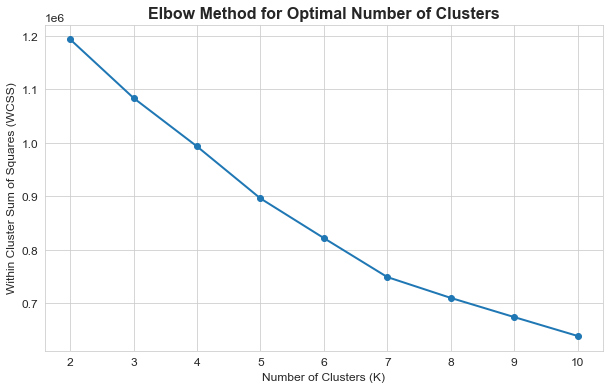

In [56]:
plt.figure(figsize=(10,6))

plt.plot(
    K,
    wcss,
    marker="o",
    linewidth=2
)

plt.title(
    "Elbow Method for Optimal Number of Clusters",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Clusters (K)")
plt.ylabel("Within Cluster Sum of Squares (WCSS)")

plt.xticks(K)

plt.grid(True)

plt.show()

## Silhouette Analysis

The Silhouette Score evaluates how well-separated the clusters are.

The score ranges from **−1 to +1**:

- **+1** → Well-separated and compact clusters.
- **0** → Overlapping clusters.
- **−1** → Poor clustering.

Due to the large size of the customer dataset, the silhouette score is computed using a random sample of customers to reduce computational time while maintaining a reliable estimate of clustering quality.

In [57]:
from sklearn.metrics import silhouette_score

In [58]:
# ==========================================================
# Silhouette Analysis
# ==========================================================

silhouette_scores = []

K = range(2, 11)

for k in K:

    # Build model
    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=10
    )

    # Fit on the FULL scaled dataset
    labels = kmeans.fit_predict(X_scaled)

    # Evaluate using a sample for speed
    score = silhouette_score(
        X_scaled,
        labels,
        sample_size=10000,
        random_state=42
    )

    silhouette_scores.append(score)

    print(f"K = {k}, Silhouette Score = {score:.4f}")

MemoryError: Unable to allocate 763. MiB for an array with shape (10000, 10000) and data type float64

In [59]:
silhouette_results = pd.DataFrame({

    "Number of Clusters": list(K),

    "Silhouette Score": silhouette_scores

})

silhouette_results

ValueError: All arrays must be of the same length

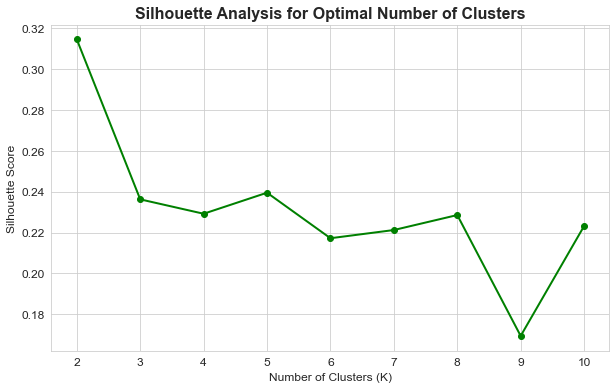

In [83]:
plt.figure(figsize=(10,6))

plt.plot(
    silhouette_results["Number of Clusters"],
    silhouette_results["Silhouette Score"],
    marker="o",
    linewidth=2,
    color="green"
)

plt.title(
    "Silhouette Analysis for Optimal Number of Clusters",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")

plt.xticks(K)

plt.grid(True)

plt.show()

### Selecting the Optimal Number of Clusters

The Elbow Method and Silhouette Analysis were jointly used to determine the optimal number of customer clusters.

The Silhouette Analysis achieved its highest score at **K = 2**, indicating the strongest statistical separation between two broad customer groups. However, a two-cluster solution provides limited business insight and does not adequately capture the diversity of customer purchasing behaviour.

The Elbow Method indicates that the reduction in Within-Cluster Sum of Squares (WCSS) begins to level off around **K = 5**, suggesting diminishing returns from adding additional clusters.

Although the silhouette score decreases slightly for K values greater than 2, the score for **K = 5 (0.240)** remains competitive while providing a more detailed and actionable customer segmentation.

Considering both statistical evaluation and business interpretability, **five customer clusters** were selected for the final K-Means model.

In [62]:
optimal_k = 5

In [63]:
from joblib import dump

kmeans = KMeans(
    n_clusters=5,
    random_state=42,
    n_init=10
)

customer_df["Cluster"] = kmeans.fit_predict(X_scaled)

# Save the trained model
dump(kmeans, "customer_segmentation_kmeans2.pkl")

['customer_segmentation_kmeans2.pkl']

## Train the K-Means Model

In [64]:
kmeans = KMeans(

    n_clusters=optimal_k,

    random_state=42,

    n_init=10

)

customer_df["Cluster"] = kmeans.fit_predict(
    X_scaled
)

customer_df.head()

,customer_unique_id,Recency,Frequency,Monetary,Average_Review_Score,Average_Delivery_Time,Average_Delivery_Delay,Average_Processing_Time,Average_Shipping_Time,Average_Freight,Average_Installments,Product_Categories,Preferred_Payment_Method,Average_Order_Value,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,141.90,5.0,6.0,-5.0,1.0,4.0,12.00,8.0,1,credit_card,141.90,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,27.19,4.0,3.0,-5.0,1.0,1.0,8.29,1.0,1,credit_card,27.19,0
2,0000f46a3911fa3c0805444483337064,542,1,86.22,3.0,25.0,-2.0,2.0,23.0,17.22,8.0,1,credit_card,86.22,1
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,43.62,4.0,20.0,-12.0,0.0,19.0,17.63,4.0,1,credit_card,43.62,0
4,0004aac84e0df4da2b147fca70cf8255,293,1,196.89,5.0,13.0,-8.0,1.0,11.0,16.89,6.0,1,credit_card,196.89,0


In [65]:
# Save the trained model

dump(kmeans,"models/customer_segmentation_kmeans.pkl")

['models/customer_segmentation_kmeans.pkl']

# Customer Segment Profiling

After assigning customers to clusters, the next step is to profile each customer segment.

Cluster profiling summarizes the average characteristics of customers within each cluster. This enables meaningful business interpretation and supports targeted marketing, customer retention strategies, and personalized recommendations.

In [66]:
#Cluster Size
cluster_size = (
    customer_df["Cluster"]
    .value_counts()
    .sort_index()
    .reset_index()
)

cluster_size.columns = [
    "Cluster",
    "Number_of_Customers"
]

cluster_size

,Cluster,Number_of_Customers
0,0,63632
1,1,8677
2,2,2873
3,3,18775
4,4,1463


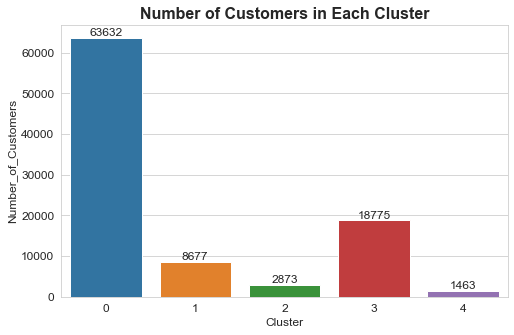

In [67]:
plt.figure(figsize=(8,5))

ax = sns.barplot(
    data=cluster_size,
    x="Cluster",
    y="Number_of_Customers"
)

for container in ax.containers:
    ax.bar_label(container)

plt.title(
    "Number of Customers in Each Cluster",
    fontsize=16,
    fontweight="bold"
)

plt.show()

In [68]:
cluster_profile = (
    customer_df
    .groupby("Cluster")
    .agg({

        "Recency":"mean",

        "Frequency":"mean",

        "Monetary":"mean",

        "Average_Order_Value":"mean",

        "Average_Review_Score":"mean",

        "Average_Delivery_Time":"mean",

        "Average_Delivery_Delay":"mean",

        "Average_Freight":"mean",

        "Average_Installments":"mean",

        "Product_Categories":"mean"

    })
    .round(2)
)

cluster_profile

,Recency,Frequency,Monetary,Average_Order_Value,Average_Review_Score,Average_Delivery_Time,Average_Delivery_Delay,Average_Freight,Average_Installments,Product_Categories
Cluster,,,,,,,,,,
0,242.19,1.00,198.62,161.83,4.28,9.56,-13.86,19.47,3.43,0.99
1,248.11,1.00,262.16,210.79,2.53,32.77,4.85,29.00,3.47,0.99
2,225.94,2.11,614.48,169.35,4.16,11.48,-13.00,19.00,3.37,1.60
3,254.49,1.00,183.54,136.47,4.24,11.15,-12.62,19.01,1.01,0.99
4,173.09,1.01,169.97,141.92,4.18,10.31,-11.61,19.12,1.00,0.99


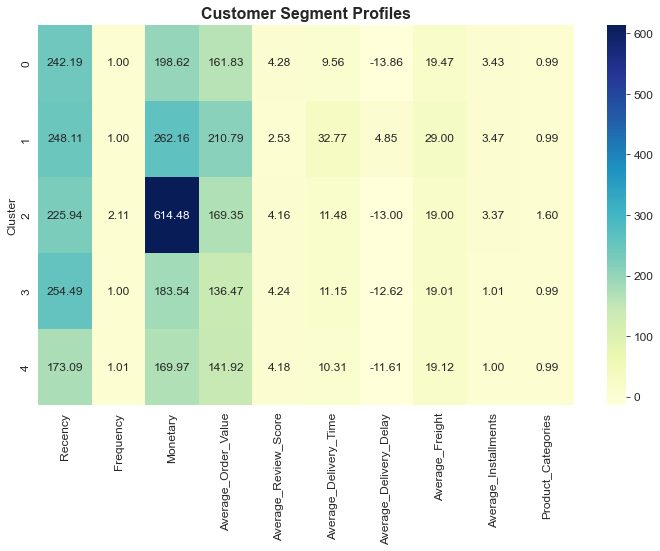

In [69]:
#Heatmap
plt.figure(figsize=(12,7))

sns.heatmap(
    cluster_profile,
    annot=True,
    cmap="YlGnBu",
    fmt=".2f"
)

plt.title(
    "Customer Segment Profiles",
    fontsize=16,
    fontweight="bold"
)

plt.show()

### Payment Preference by Cluster

In [70]:
#Payment Preference by Cluster
payment_cluster = pd.crosstab(
    customer_df["Cluster"],
    customer_df["Preferred_Payment_Method"]
)

payment_cluster

Preferred_Payment_Method,boleto,credit_card,debit_card,voucher
Cluster,,,,
0,0,63632,0,0
1,1322,7290,1,64
2,646,2172,0,55
3,17127,0,0,1648
4,0,0,1463,0


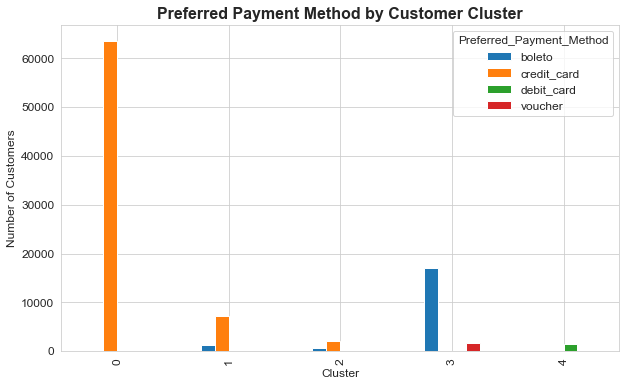

In [71]:
payment_cluster.plot(
    kind="bar",
    figsize=(10,6)
)

plt.title(
    "Preferred Payment Method by Customer Cluster",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("Number of Customers")

plt.show()

### PCA Visualization

In [72]:
#PCA Visualization
pca = PCA(
    n_components=2,
    random_state=42
)

X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame({

    "PC1":X_pca[:,0],

    "PC2":X_pca[:,1],

    "Cluster":customer_df["Cluster"]

})

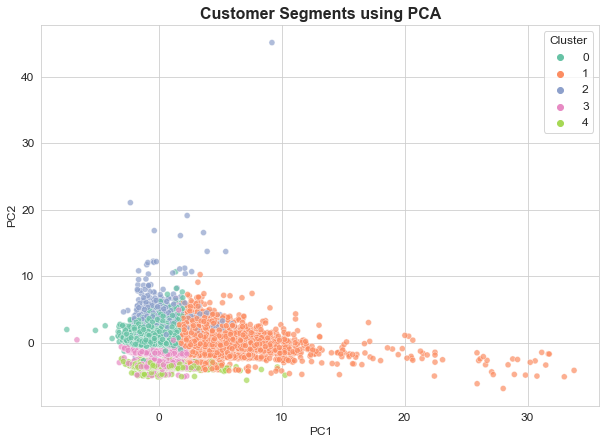

In [73]:
plt.figure(figsize=(10,7))

sns.scatterplot(

    data=pca_df,

    x="PC1",

    y="PC2",

    hue="Cluster",

    palette="Set2",

    alpha=0.7

)

plt.title(
    "Customer Segments using PCA",
    fontsize=16,
    fontweight="bold"
)

plt.show()

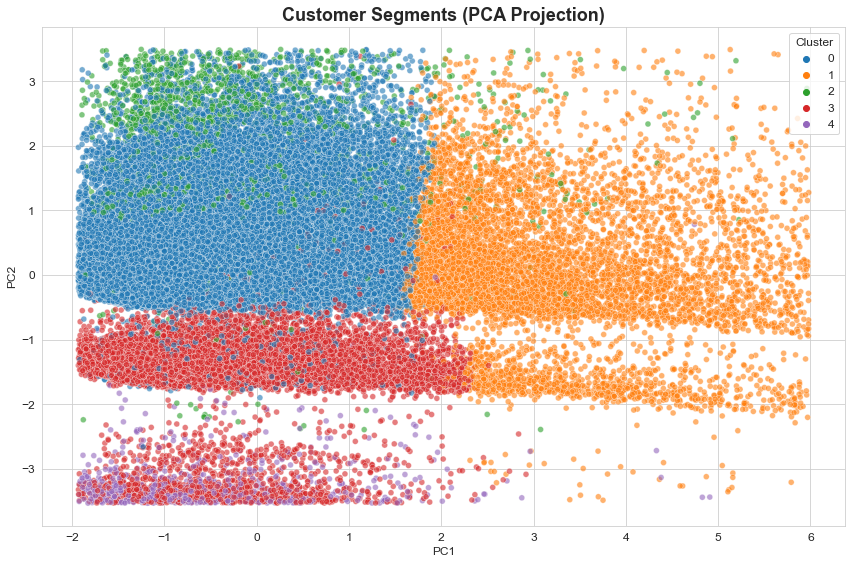

In [74]:
pca_plot = pca_df.copy()

pca_plot = pca_plot[
    (pca_plot["PC1"] >= pca_plot["PC1"].quantile(0.01)) &
    (pca_plot["PC1"] <= pca_plot["PC1"].quantile(0.99)) &
    (pca_plot["PC2"] >= pca_plot["PC2"].quantile(0.01)) &
    (pca_plot["PC2"] <= pca_plot["PC2"].quantile(0.99))
]

plt.figure(figsize=(12,8))

sns.scatterplot(
    data=pca_plot,
    x="PC1",
    y="PC2",
    hue="Cluster",
    palette="tab10",
    alpha=0.6,
    s=35
)

plt.title(
    "Customer Segments (PCA Projection)",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()

plt.show()

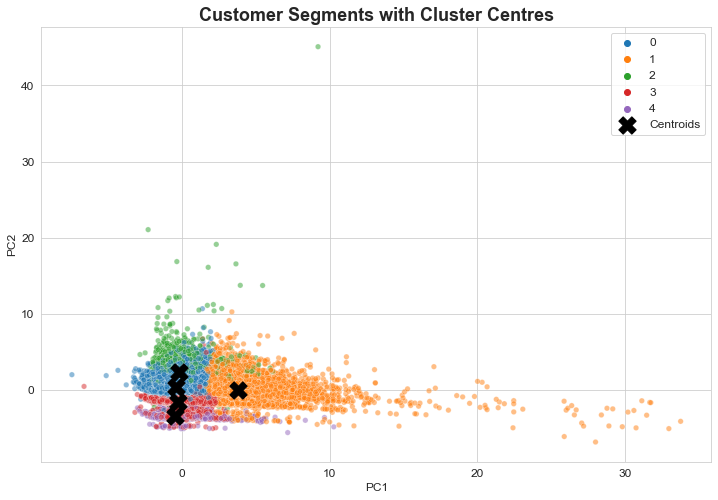

In [75]:
# Transform cluster centres into PCA space
centroids = pca.transform(kmeans.cluster_centers_)

plt.figure(figsize=(12,8))

sns.scatterplot(
    data=pca_df,
    x="PC1",
    y="PC2",
    hue="Cluster",
    palette="tab10",
    s=30,
    alpha=0.5
)

plt.scatter(
    centroids[:,0],
    centroids[:,1],
    s=300,
    c="black",
    marker="X",
    label="Centroids"
)

plt.title(
    "Customer Segments with Cluster Centres",
    fontsize=18,
    fontweight="bold"
)

plt.legend()

plt.show()

In [76]:
cluster_names = {
    0:"Occasional",
    1:"High Value",
    2:"Premium",
    3:"New",
    4:"At Risk"
}

pca_df["Segment"] = pca_df["Cluster"].map(cluster_names)

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

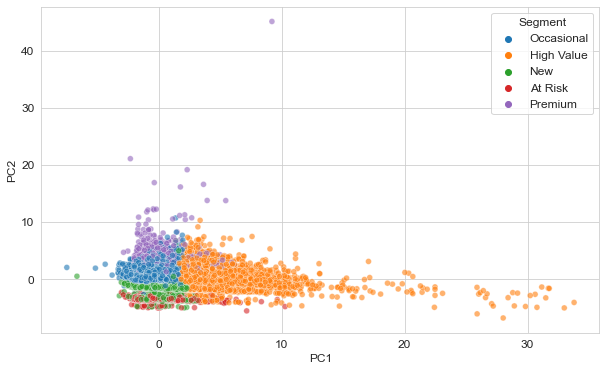

In [77]:
sns.scatterplot(
    data=pca_df,
    x="PC1",
    y="PC2",
    hue="Segment",
    palette="tab10",
    s=35,
    alpha=0.6
)

In [78]:
customer_df.to_csv(
    "customer_segments.csv",
    index=False
)

In [79]:
import joblib

joblib.dump(
    customer_df,
    "/models/customer_segments.pkl"
)

['/models/customer_segments.pkl']

In [80]:
import plotly.express as px

fig = px.scatter(
    pca_df,
    x="PC1",
    y="PC2",
    color="Cluster",
    title="Customer Segments (PCA)",
    opacity=0.6,
    width=900,
    height=700
)

fig.update_traces(marker=dict(size=5))

fig.show()

## Key Findings

The customer segmentation analysis identified five distinct customer groups with varying purchasing behaviours, spending patterns, and satisfaction levels.

The most valuable segment comprises loyal customers who make repeat purchases, spend significantly more than other customers, and consistently report positive shopping experiences. These customers should be prioritized through loyalty programs and personalized marketing initiatives.

A second high-value segment consists of customers with relatively high spending but poor delivery experiences and low review scores. Improving logistics performance for this group represents an opportunity to reduce churn and increase customer lifetime value.

Most remaining customers are one-time purchasers, indicating that customer retention should be a strategic priority. Personalized recommendations, targeted promotions, and post-purchase engagement campaigns can encourage repeat purchases and improve long-term customer loyalty.

Overall, the segmentation results provide a strong foundation for targeted marketing, recommendation systems, customer relationship management, and personalized business intelligence within the NovaMart AI Retail Intelligence Platform.

In [81]:
customer_df.to_csv(
    "customer_segments.csv",
    index=False
)

print("Customer segments saved successfully.")

Customer segments saved successfully.


In [82]:
joblib.dump(
    scaler,
    "/models/customer_segmentation_scaler.pkl"
)

print("Scaler saved.")

Scaler saved.


In [83]:
joblib.dump(
    X.columns.tolist(),
    "/models/customer_segmentation_features.pkl"
)

print("Feature list saved.")

Feature list saved.
